In [100]:
import os
import librosa
import IPython.display as ipd


import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN, AgglomerativeClustering, AffinityPropagation, KMeans
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score, davies_bouldin_score 
from sklearn.decomposition import PCA
from scipy.spatial.distance import cdist

In [104]:
# Compute centroids for  clustering algorithm
def compute_centroids(features, labels):
    unique_labels = sorted(set(labels) - {-1})  # Exclude noise points (-1) if present
    centroids = {}
    for label in unique_labels:
        cluster_points = features[labels == label]
        centroid = cluster_points.mean(axis=0)
        centroids[label] = centroid
    return unique_labels, centroids

# Find top N representative samples per cluster (closest to centroid)
def find_top_representative_samples(features, labels, centroids, audio_files, n_samples=5):
    representative_samples = {}

    for label, centroid in centroids.items():
        cluster_indices = np.where(labels == label)[0]
        cluster_features = features[cluster_indices]
        cluster_files = [audio_files[i] for i in cluster_indices]

        # Compute distances from all points in this cluster to the centroid
        distances = cdist([centroid], cluster_features)[0]
        top_indices = np.argsort(distances)[:n_samples]  # Top N closest

        representative_samples[label] = [cluster_files[i] for i in top_indices]

    return representative_samples

# Plot mel spectrogram and play audio
def plot_melspec_and_play(audio_file, ax):
    y, sr = librosa.load(audio_file, sr=None)
    melspec = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    melspec_db = librosa.power_to_db(melspec, ref=np.max)

    librosa.display.specshow(melspec_db, sr=sr, x_axis='time', y_axis='mel', ax=ax)
    ax.set_title(f'{os.path.basename(audio_file)}', fontsize=10)
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Mel Frequency (Hz)")

    # Play audio if in IPython (Jupyter notebook friendly)
    display(ipd.Audio(audio_file))

# Show mel spectrograms and play audio for each cluster’s top samples
def visualize_and_listen_to_representative_samples(algorithm_name, representative_samples):
    print(f"\n--- {algorithm_name} Cluster Representative Samples ---")
    for cluster_label, files in representative_samples.items():
        print(f"\nCluster {cluster_label}:")
        fig, axes = plt.subplots(1, len(files), figsize=(20, 4), dpi=150)

        if len(files) == 1:
            axes = [axes]

        for i, file in enumerate(files):
            print(f"  - {file}")
            plot_melspec_and_play(file, axes[i])

        plt.suptitle(f"{algorithm_name} - Cluster {cluster_label}", fontsize=14)
        plt.tight_layout()
        plt.show()

def visualizations(features, cluster_labels, cluster_method, pca_features):
    """
    Create professional, research-worthy visualizations for clustering.
    
    Parameters:
        features: np.ndarray
            The dataset of shape (n_samples, n_features).
        cluster_labels: np.ndarray
            The cluster labels for each data point.
        cluster_method: str
            The clustering method used (e.g., KMeans, DBSCAN, Agglomerative).
        pca_features: np.ndarray
            PCA-transformed features for 2D visualization.
    """
    # Convert features to DataFrame for easier plotting
    feature_names = [f"Feature {i+1}" for i in range(features.shape[1])]
    df = pd.DataFrame(features, columns=feature_names)
    df['Cluster'] = cluster_labels

    # Subplots for distribution of features across clusters
    n_features = features.shape[1]
    n_cols = 2  # You can adjust this to a larger value if needed
    n_rows = (n_features // n_cols) + (1 if n_features % n_cols != 0 else 0)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
    axes = axes.flatten()  # Flatten the axes array to easily index

    # Plot histograms of each feature with clusters as hue
    for i in range(n_features):
        ax = axes[i]
        sns.histplot(data=df, x=feature_names[i], hue='Cluster', multiple="stack", kde=True, ax=ax, bins=30)
        ax.set_title(f'{cluster_method}: {feature_names[i]} Distribution Across Clusters')

    # Remove unused subplots if there are more subplots than features
    for i in range(n_features, len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

    # Plotting the clusters together in PCA-transformed space (2D)
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=pca_features[:, 0], y=pca_features[:, 1], hue=cluster_labels, palette="flare", s=10)
    plt.title(f'{cluster_method} - Clusters in PCA-reduced 2D space')
    plt.xlabel('PC 1')
    plt.ylabel('PC 2')
    plt.legend(title='Cluster')
    plt.show()

In [101]:
# Data Loading

audio_directory = r'C:\Users\alina\Desktop\Capstone Project\segmented_audio'
audio_files = [os.path.join(audio_directory, f) for f in os.listdir(audio_directory) if f.endswith('.wav')]

# Load the saved scaled features
features_scaled = np.load(r'C:\Users\alina\Desktop\characterizing-soundscapes\cluster_data\features_scaled.npy')

# Features of use
selected_features = features_scaled[:,[0,1,2,3]]

# Dimensionality reduction
pca = PCA(n_components=2)
features_2d = pca.fit_transform(selected_features)

In [106]:
# Loading DBSCAN labels
df_dbscan = pd.read_csv(r'C:\Users\alina\Desktop\characterizing-soundscapes\cluster_basic\dbscan_labels.csv')
dbscan_labels = df_dbscan['dbscan_labels'].values

# Filter to only keep non-noise files
df_non_noise = df_dbscan[df_dbscan['dbscan_labels'] != -1]

print(f"Original files: {len(df_dbscan)}, Non-noise files: {len(df_non_noise)}")

Original files: 86335, Non-noise files: 81097


In [110]:
non_noise_indices = df_dbscan[df_dbscan['dbscan_labels'] != -1].index.values
X_non_noise = selected_features[non_noise_indices]

print(f"Shape of full features: {selected_features.shape}")
print(f"Shape after removing noise: {X_non_noise.shape}")

Shape of full features: (86335, 4)
Shape after removing noise: (81097, 4)


In [112]:
from collections import defaultdict

# Group feature vectors by DBSCAN cluster label
cluster_to_features = defaultdict(list)

for idx, label in enumerate(df['dbscan_labels']):
    if label != -1:
        cluster_to_features[label].append(selected_features[idx])

# Compute centroids (mean vector per cluster)
centroids = {cluster: np.mean(np.vstack(vectors), axis=0)
             for cluster, vectors in cluster_to_features.items()}

# Convert centroids into array for clustering
centroid_array = np.vstack(list(centroids.values()))
centroid_labels = np.array(list(centroids.keys()))

print(f"Total non-noise clusters found: {len(centroids)}")



Total non-noise clusters found: 173


In [113]:
from sklearn.cluster import AgglomerativeClustering

n_meta_clusters = 5  # You can tune this later using silhouette score if needed
agg = AgglomerativeClustering(n_clusters=n_meta_clusters, linkage='ward')
meta_cluster_labels = agg.fit_predict(centroid_array)

# Store mapping of DBSCAN cluster → meta-cluster
dbscan_to_meta = dict(zip(centroid_labels, meta_cluster_labels))

print("DBSCAN cluster → Meta-cluster mapping:")
print(dbscan_to_meta)


DBSCAN cluster → Meta-cluster mapping:
{np.int64(0): np.int64(1), np.int64(1): np.int64(1), np.int64(2): np.int64(1), np.int64(3): np.int64(1), np.int64(152): np.int64(2), np.int64(135): np.int64(3), np.int64(4): np.int64(2), np.int64(68): np.int64(2), np.int64(75): np.int64(2), np.int64(5): np.int64(2), np.int64(70): np.int64(2), np.int64(6): np.int64(2), np.int64(7): np.int64(3), np.int64(8): np.int64(3), np.int64(9): np.int64(3), np.int64(10): np.int64(1), np.int64(12): np.int64(1), np.int64(11): np.int64(1), np.int64(13): np.int64(1), np.int64(14): np.int64(1), np.int64(15): np.int64(2), np.int64(17): np.int64(4), np.int64(16): np.int64(4), np.int64(18): np.int64(4), np.int64(19): np.int64(4), np.int64(20): np.int64(4), np.int64(33): np.int64(4), np.int64(35): np.int64(0), np.int64(21): np.int64(0), np.int64(39): np.int64(0), np.int64(22): np.int64(0), np.int64(26): np.int64(0), np.int64(36): np.int64(0), np.int64(23): np.int64(0), np.int64(24): np.int64(0), np.int64(25): np.int64(

In [116]:
# Initialize column for meta-cluster
df_dbscan['meta_cluster'] = -1  # Noise stays -1

# Assign meta-cluster to each non-noise point
for idx, label in enumerate(df_dbscan['dbscan_labels']):
    if label != -1:
        df_dbscan.at[idx, 'meta_cluster'] = dbscan_to_meta[label]

# Save final result
df_dbscan.to_csv("metacluster_labels.csv", index=False)
print("Saved: metacluster_labels.csv")


Saved: dbscan_with_meta_clusters.csv


In [118]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

sil_score = silhouette_score(centroid_array, meta_cluster_labels)
db_score = davies_bouldin_score(centroid_array, meta_cluster_labels)
calinski_harabasz_score = calinski_harabasz_score(centroid_array, meta_cluster_labels)

print(f"Silhouette Score (Meta-Clustering): {sil_score:.3f}")
print(f"Davies-Bouldin Index (Meta-Clustering): {db_score:.3f}")
print(f"Calinski-Harabasz Index (Meta-Clustering): {calinski_harabasz_score:.3f}")


Silhouette Score (Meta-Clustering): 0.395
Davies-Bouldin Index (Meta-Clustering): 0.996
Calinski-Harabasz Index (Meta-Clustering): 182.470


In [123]:
# Open the saved meta-cluster labels
df_meta = pd.read_csv("metacluster_labels.csv")
df_non_noise = df_meta[df_meta['Cluster'] != -1]

In [125]:
df_non_noise.head()

,Feature 0,Feature 1,Feature 2,Feature 3,Cluster,Audio_File,Refined_Cluster
0,0.829010,0.596388,-0.267049,-0.071550,172,C:\Users\alina\Desktop\Capstone Project\segmen...,3
1,0.878343,0.544962,-0.331938,0.031186,172,C:\Users\alina\Desktop\Capstone Project\segmen...,3
2,0.790725,0.657275,-0.269437,-0.074569,172,C:\Users\alina\Desktop\Capstone Project\segmen...,3
3,0.792768,0.676775,-0.452803,-0.017818,172,C:\Users\alina\Desktop\Capstone Project\segmen...,3
4,0.749428,0.705711,-0.330842,-0.010809,172,C:\Users\alina\Desktop\Capstone Project\segmen...,3


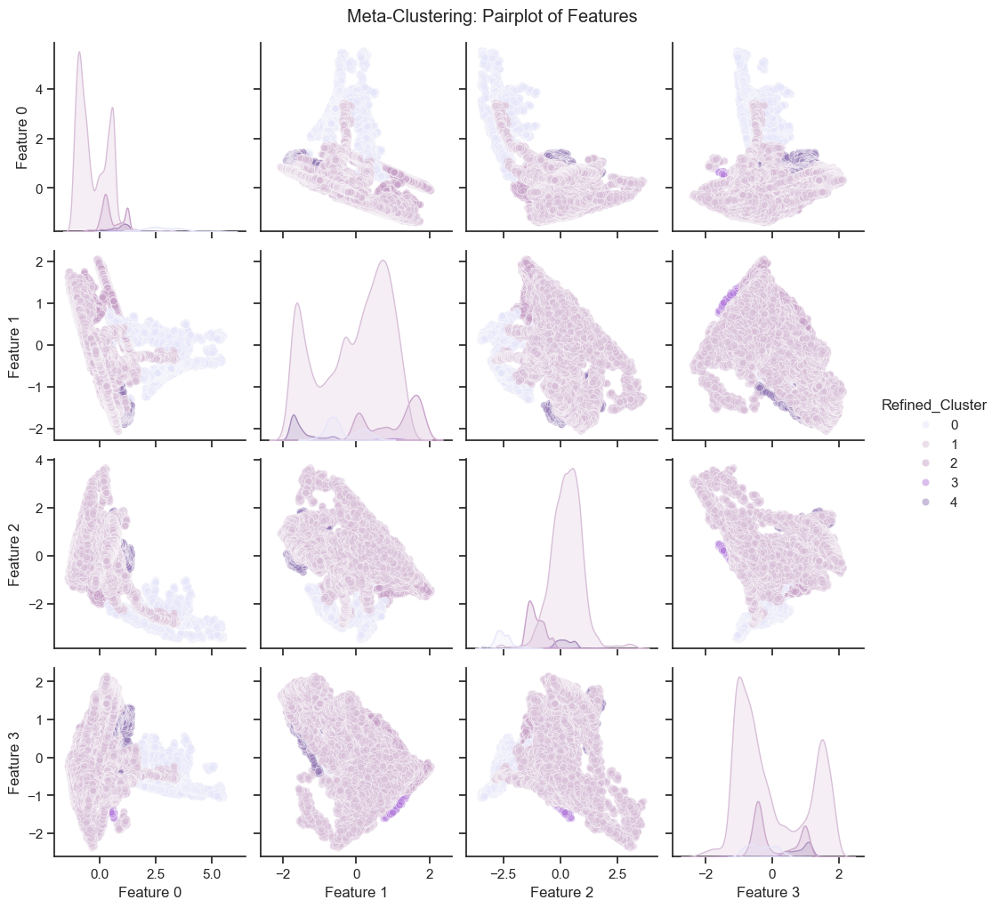

In [127]:
# Pairplot across the first 4 features, colored by Refined_Cluster
lavender_palette = ["#E6E6FA", "#D8BFD8", "#C8A2C8", "#B57EDC", "#967BB6"]
sns.pairplot(df_non_noise, vars=['Feature 0', 'Feature 1', 'Feature 2', 'Feature 3'], 
             hue="Refined_Cluster", 
             palette=lavender_palette, 
             plot_kws={'alpha': 0.5})

plt.suptitle("Meta-Clustering: Pairplot of Features ", y=1.02)
plt.show()


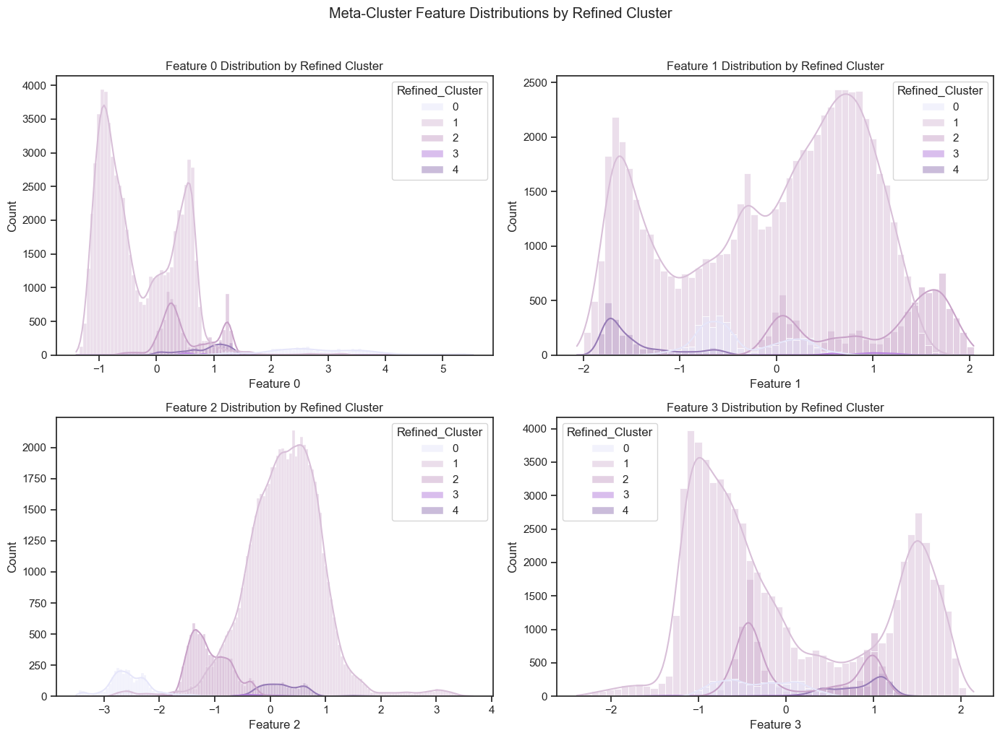

In [129]:
# Plot each feature as a histogram grouped by Refined_Cluster
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

features = ['Feature 0', 'Feature 1', 'Feature 2', 'Feature 3']

for i, feature in enumerate(features):
    ax = axes[i // 2, i % 2]
    sns.histplot(data=df_non_noise, x=feature, hue='Refined_Cluster', kde=True, palette=lavender_palette, ax=ax)
    ax.set_title(f'{feature} Distribution by Refined Cluster')

plt.suptitle("Meta-Cluster Feature Distributions by Refined Cluster", y=1.02)
plt.tight_layout()
plt.show()



Meta-Cluster -1: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180929_000000_segment_848.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180929_000000_segment_847.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180929_000000_segment_856.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181002_000000_segment_6287.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180929_000000_segment_645.wav


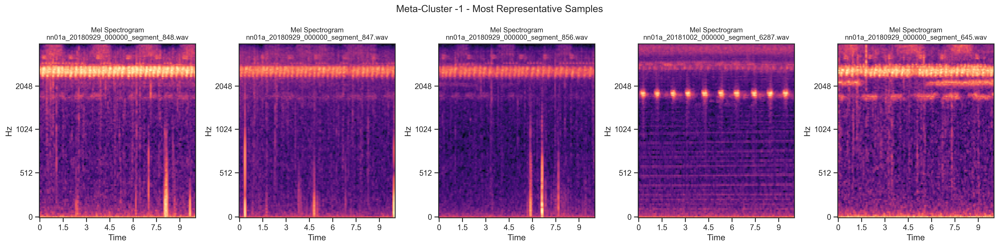


Meta-Cluster 0: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_49.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_60.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_249.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_337.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_55.wav


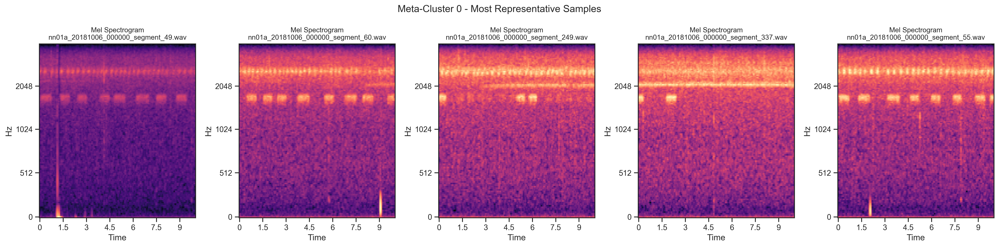


Meta-Cluster 1: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181005_000000_segment_6165.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181002_000000_segment_869.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181005_000000_segment_5053.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181004_000000_segment_5955.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181005_000000_segment_2001.wav


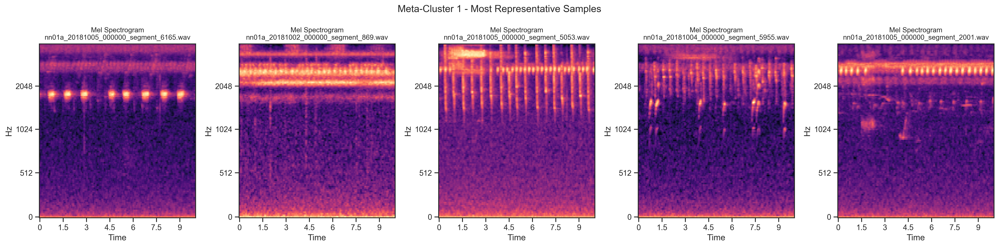


Meta-Cluster 2: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20201209_000100_segment_1057.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20201209_000100_segment_1190.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20201209_000100_segment_988.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20201209_000100_segment_1632.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20201209_000100_segment_1308.wav


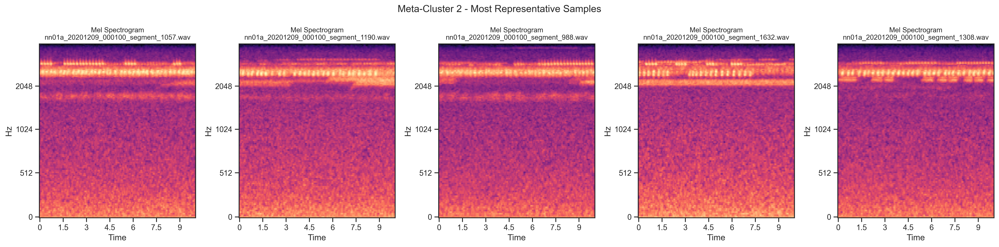


Meta-Cluster 3: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20201209_000100_segment_6316.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20201209_000100_segment_6369.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20201209_000100_segment_6276.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20201209_000100_segment_6121.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20201209_000100_segment_6035.wav


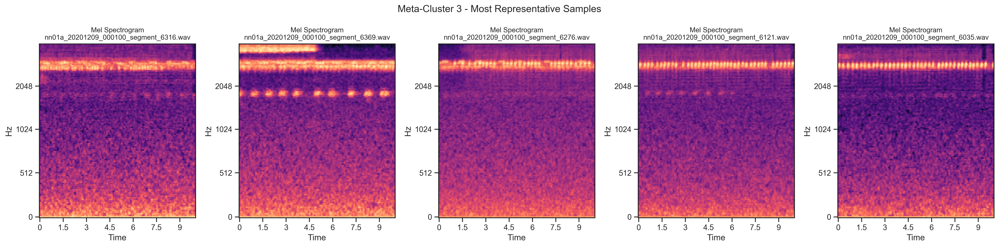


Meta-Cluster 4: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_7887.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_7889.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_7865.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_7884.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_7886.wav


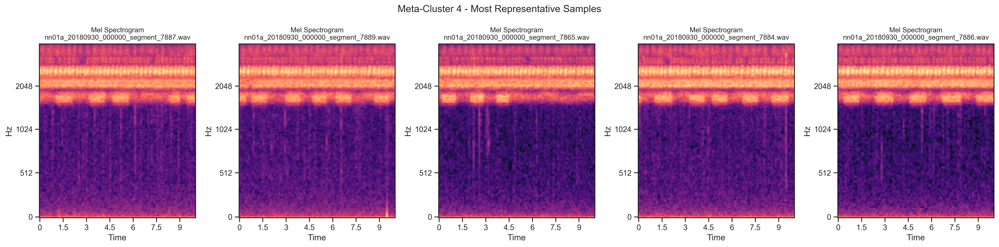

In [134]:
from sklearn.metrics import pairwise_distances
import IPython.display as ipd  # For audio playback in Jupyter


# Extract features, labels, and file paths
feature_columns = ['Feature 0', 'Feature 1', 'Feature 2', 'Feature 3']
features = df_meta[feature_columns].values
labels = df_meta['Refined_Cluster'].values
file_paths = df_meta['Audio_File'].values

def compute_cluster_centroids(features, labels):
    """
    Compute centroid for each meta-cluster.
    """
    centroids = {}
    for cluster_label in np.unique(labels):
        cluster_points = features[labels == cluster_label]
        centroids[cluster_label] = np.mean(cluster_points, axis=0)
    return centroids

def find_most_representative_samples(features, labels, file_paths, n_samples=5):
    """
    Find the top `n_samples` closest files to each cluster's centroid.
    """
    centroids = compute_cluster_centroids(features, labels)

    representative_samples = {}

    for cluster_label, centroid in centroids.items():
        cluster_indices = np.where(labels == cluster_label)[0]
        cluster_features = features[cluster_indices]
        cluster_files = file_paths[cluster_indices]

        # Compute distance from each file to the centroid
        distances = pairwise_distances(cluster_features, centroid.reshape(1, -1), metric='euclidean')

        # Find top closest files
        sorted_indices = np.argsort(distances.ravel())[:n_samples]
        representative_samples[cluster_label] = [cluster_files[i] for i in sorted_indices]

    return representative_samples

def plot_melspec_and_play(audio_file, ax):
    """
    Plot mel spectrogram and play audio.
    """
    # Load audio file
    y, sr = librosa.load(audio_file, sr=None)

    # Compute mel spectrogram
    melspec = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    melspec_db = librosa.power_to_db(melspec, ref=np.max)

    # Plot
    librosa.display.specshow(melspec_db, sr=sr, x_axis='time', y_axis='mel', ax=ax)
    ax.set_title(f'Mel Spectrogram\n{os.path.basename(audio_file)}', fontsize=10)

    # Play audio (works only in Jupyter/Colab)
    display(ipd.Audio(audio_file))

def display_representative_samples(df, n_samples=5):
    """
    For each meta-cluster, show top 5 representative audio files' mel spectrograms and play them.
    """
    features = df[feature_columns].values
    labels = df['Refined_Cluster'].values
    file_paths = df['Audio_File'].values

    representative_samples = find_most_representative_samples(features, labels, file_paths, n_samples)

    for cluster_label, files in representative_samples.items():
        print(f"\nMeta-Cluster {cluster_label}: Most Representative Samples")
        fig, axes = plt.subplots(1, len(files), figsize=(20, 5), dpi=300)

        if len(files) == 1:
            axes = [axes]  # In case only 1 file (avoid crash)

        for i, file in enumerate(files):
            print(f"  - {file}")
            plot_melspec_and_play(file, axes[i])

        plt.suptitle(f"Meta-Cluster {cluster_label} - Most Representative Samples", fontsize=14)
        plt.tight_layout()
        plt.show()

# Run everything
display_representative_samples(df_meta, n_samples=5)


In [147]:
selected_samples = find_most_representative_samples(features, labels, file_paths, n_samples=100)

<Figure size 1200x600 with 0 Axes>

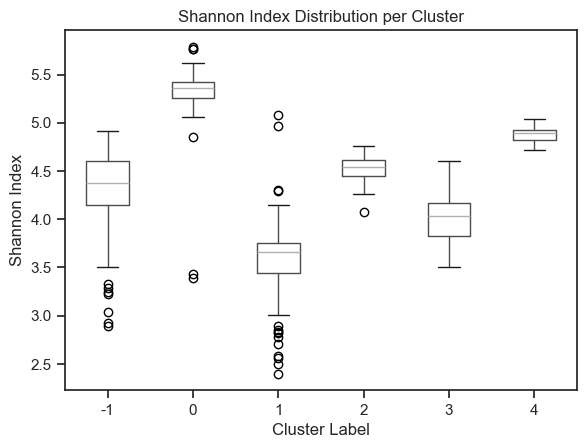

✅ Shannon Index computed and saved to 'shannon_indices_per_cluster.csv'. Boxplot generated.


In [151]:
def compute_shannon_index(audio, sr, n_fft=1024, hop_length=512):
    S = np.abs(librosa.stft(audio, n_fft=n_fft, hop_length=hop_length))**2
    energy_per_band = np.sum(S, axis=1)
    total_energy = np.sum(energy_per_band)
    proportions = energy_per_band / total_energy
    proportions = proportions[proportions > 0]  # Avoid log(0) errors
    shannon_index = -np.sum(proportions * np.log(proportions))
    return shannon_index

# Store results
shannon_results = []

# Loop through each cluster and its files
for cluster_label, files in selected_samples.items():
    for file_path in files:
        audio, sr = librosa.load(file_path, sr=None)
        shannon_index = compute_shannon_index(audio, sr)

        shannon_results.append({
            "filename": file_path,
            "cluster_label": cluster_label,
            "shannon_index": shannon_index
        })

# Convert results to DataFrame
shannon_df = pd.DataFrame(shannon_results)

# Save results to CSV
shannon_df.to_csv("shannon_indices_per_cluster.csv", index=False)

# Plot boxplot per cluster
plt.figure(figsize=(12, 6))
shannon_df.boxplot(column='shannon_index', by='cluster_label', grid=False)
plt.title("Shannon Index Distribution per Cluster")
plt.suptitle("")
plt.xlabel("Cluster Label")
plt.ylabel("Shannon Index")
plt.show()

print("✅ Shannon Index computed and saved to 'shannon_indices_per_cluster.csv'. Boxplot generated.")

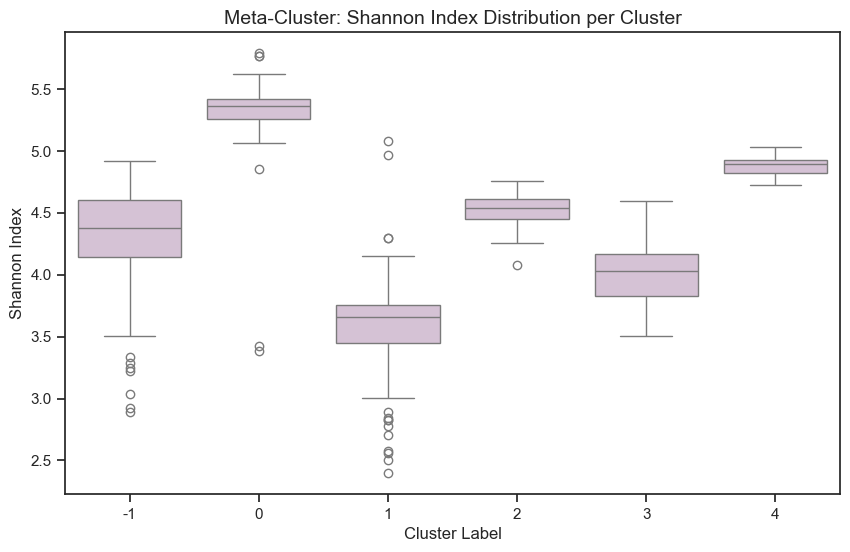

In [154]:
plt.figure(figsize=(10, 6))

# Use seaborn for color control (matplotlib boxplot itself is tricky with colors)
sns.boxplot(x='cluster_label', y='shannon_index', data=shannon_df, color='thistle')  # 'thistle' is a nice lavender

plt.title("Meta-Cluster: Shannon Index Distribution per Cluster", fontsize=14)
plt.xlabel("Cluster Label", fontsize=12)
plt.ylabel("Shannon Index", fontsize=12)
plt.grid(False)
plt.show()

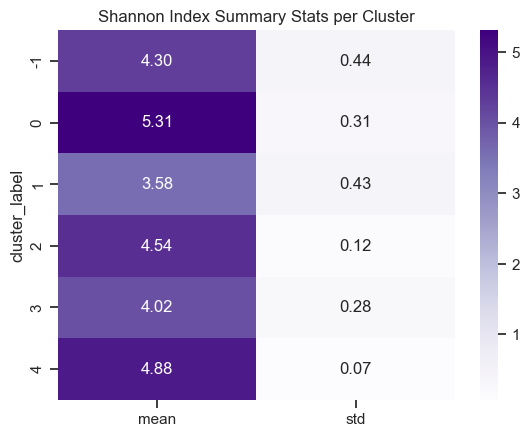

In [155]:
summary = shannon_df.groupby('cluster_label')['shannon_index'].agg(['mean', 'std']).reset_index()
sns.heatmap(summary.set_index('cluster_label'), annot=True, cmap='Purples', fmt=".2f")
plt.title("Shannon Index Summary Stats per Cluster")
plt.show()


C:\Users\alina\AppData\Local\Temp\ipykernel_33384\1981419380.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='cluster_label', y='shannon_index', data=shannon_df, palette='Purples')


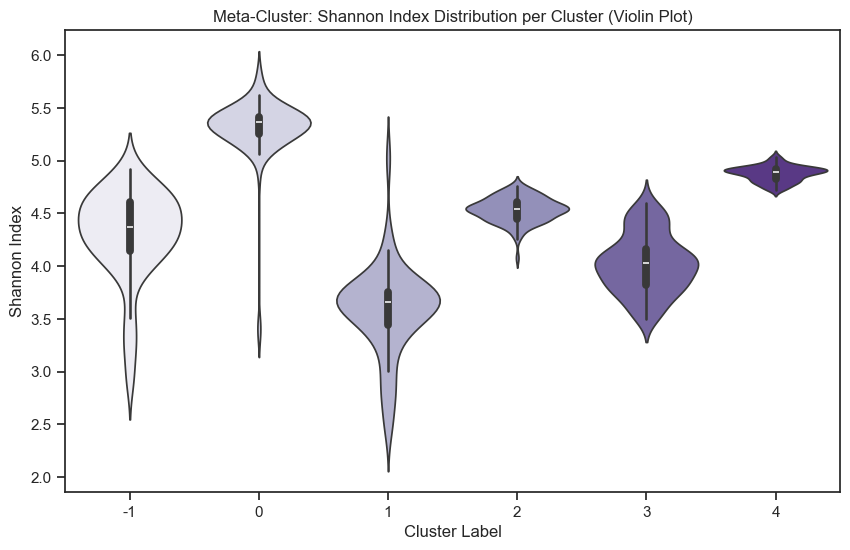

In [159]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='cluster_label', y='shannon_index', data=shannon_df, palette='Purples')
plt.title('Meta-Cluster: Shannon Index Distribution per Cluster (Violin Plot)', fontsize=12)
plt.xlabel('Cluster Label', fontsize=12)
plt.ylabel('Shannon Index', fontsize=12)
plt.show()

